In [124]:
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf, acf
from statsmodels.tsa.api import adfuller
import matplotlib.pyplot as plt

In [139]:
def check_stationarity(df):
    results = adfuller(df)[1:3]
    s = 'Non-Stationary'
    if results[0] < 0.05:
        s = 'Stationary'
    print(f"'{s}\t p-value:{results[0]} \t lags:{results[1]}")
    return (s, results[0])
#check_stationarity(df["open"].diff())

In [3]:
df = pd.read_csv("Training_Df.csv")

<AxesSubplot:>

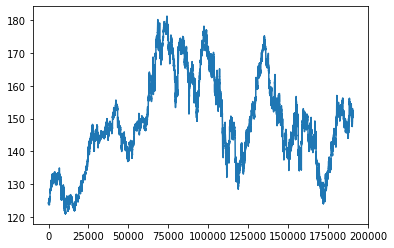

In [122]:
df["open"].plot()

<AxesSubplot:>

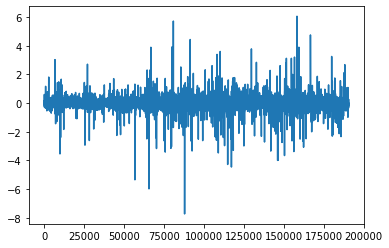

In [4]:
df["open"].diff().plot()

<AxesSubplot:title={'center':'Post Differencing'}>

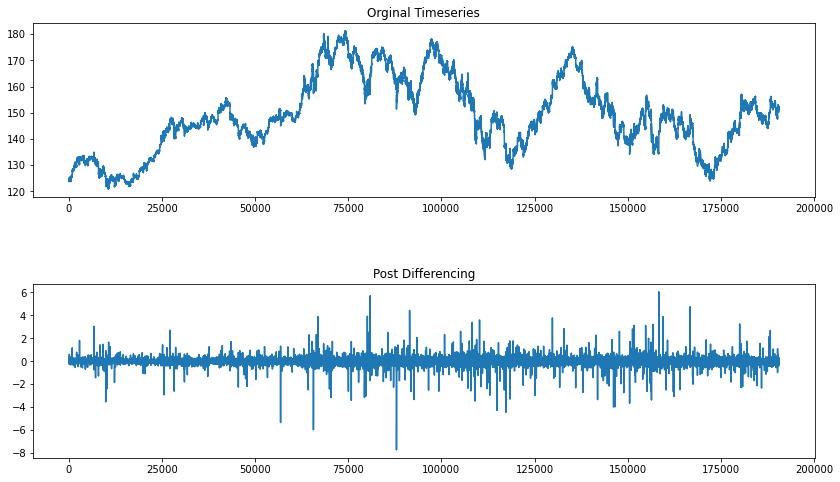

In [125]:
fig, ax = plt.subplots(2, 1, figsize=(14, 8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=0.5)

df["open"].plot(title='Orginal Timeseries', legend=False, ax=ax[0])

df["open"].diff().plot(title='Post Differencing', legend=False, ax=ax[1])

C:\Users\Joey\anaconda3\lib\site-packages\statsmodels\tsa\stattools.py:667: FutureWarning: fft=True will become the default after the release of the 0.12 release of statsmodels. To suppress this warning, explicitly set fft=False.
  warnings.warn(


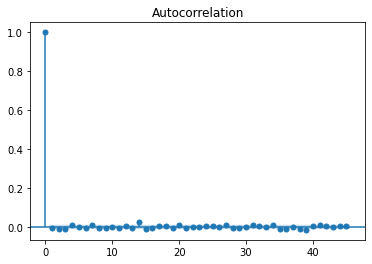

In [37]:
import statsmodels.api as sm
plot_acf(df["open"].diff()[160000:])
acf_vals = sm.tsa.acf(df["open"].diff()[160000:], nlags = 600)

In [34]:
import numpy as np
sig_lags = np.where(np.abs(acf_vals) > .05)[0]

print(f"Significant lags: {sig_lags}")

Significant lags: [0]


In [35]:
acf_vals

array([ 1.00000000e+00, -3.56665857e-03, -1.01283158e-02, -1.06738518e-02,
        1.12195691e-02, -2.70485779e-03, -3.63469514e-03,  9.30744087e-03,
       -3.26115516e-03, -5.72611283e-03, -2.20471237e-03, -7.04546534e-03,
        4.37072983e-03, -4.79546776e-03,  2.61381695e-02, -1.03847524e-02,
       -4.68576900e-03,  5.79829853e-03,  3.06916204e-03, -7.02686509e-03,
        1.09709252e-02, -3.68563881e-03, -2.34358628e-03, -2.81894113e-03,
        6.92816277e-03,  2.49621473e-03,  1.99875671e-03,  1.07087574e-02,
       -5.47456417e-03, -4.66906088e-03, -4.77658881e-04,  7.60610496e-03,
        2.93032601e-03,  1.15618052e-03,  8.82143182e-03, -1.27333755e-02,
       -8.99805612e-03, -9.46847172e-04, -8.57382853e-03, -1.52498588e-02,
        2.80901028e-03,  7.65743991e-03,  3.57318730e-03,  5.68532124e-04,
        5.29987901e-03,  4.05025691e-03,  4.39219935e-04,  3.20964485e-03,
       -6.63365309e-03, -2.64719665e-03, -1.92222449e-03,  4.15419568e-03,
        8.55568729e-04,  

In [128]:
from gtda.time_series import SingleTakensEmbedding
from gtda.plotting import plot_point_cloud
embedding_dimension_nonperiodic = 195
embedding_time_delay_nonperiodic = 14
stride = 1

embedder_nonperiodic = SingleTakensEmbedding(
    parameters_type="fixed",
    n_jobs=2,
    time_delay=embedding_time_delay_nonperiodic,
    dimension=embedding_dimension_nonperiodic,
    stride=stride,
)

y_nonperiodic_embedded = embedder_nonperiodic.fit_transform(df["open"].diff())

#plot_point_cloud(y_nonperiodic_embedded[:10000])

In [41]:
len(y_nonperiodic_embedded)

187861

In [44]:
len(df["open"].diff())

190577

In [48]:
temp = df["open"].diff()[90577:]

In [51]:
#Target moved to dataframe for later application
temp = pd.DataFrame(temp)

In [54]:
y_nonperiodic_embedded[87861:].shape

(100000, 195)

In [63]:
len(temp[60:])
len((y_nonperiodic_embedded[87861:])[:-60])

99940

In [ ]:
# Training data and target creation

In [65]:
training_data = (y_nonperiodic_embedded[87861:])[:-60]

In [66]:
target = temp[60:]

In [100]:
#Model Imports 
from sklearn.ensemble import RandomForestRegressor as RF
from sklearn.linear_model import LinearRegression as LR
from xgboost import XGBRegressor

In [ ]:
#Model testing

In [93]:
model = RF(n_estimators = 200, max_depth = 12)

In [129]:
model = LR()

In [136]:
model = XGBRegressor(n_estimators = 10, max_depth=10)

In [137]:
model.fit(training_data[0:99900], target["open"][0:99900])

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=10, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             n_estimators=10, n_jobs=None, num_parallel_tree=None,
             predictor=None, random_state=None, ...)

In [138]:
model.score(training_data[99900:], target["open"][99900:])

-0.1996536100161368

In [117]:
import plotly.express as px

In [119]:
res = model.predict(training_data[0:99900])-target["open"][0:99900]

In [120]:
px.scatter(x = list(range(0,len(res))), y = res )

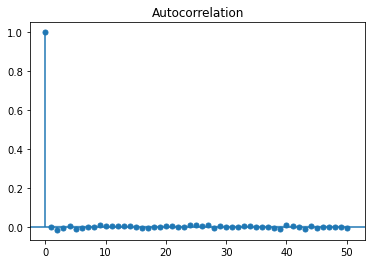

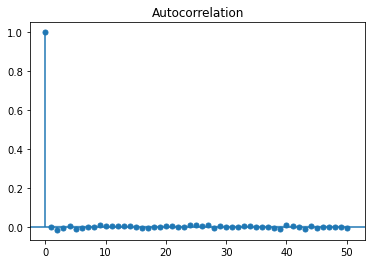

In [121]:
plot_acf(res)